#**MINE-4101: Ciencia de Datos Aplicada - TALLER 1**

Realizado por: Yeimy A. Cano M.

# **0. Importación de librerias de trabajo**

Primero se procede a hacer la importación de librerías para poder trabajar con los datos y poder realizar el análisis.

In [1]:
!pip install --upgrade pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import numpy as np
import pandas as pd

from pandas_profiling import ProfileReport

import seaborn as sns
from scipy import stats
import scipy
import statsmodels.api as sm


import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
%matplotlib inline
plt.rcParams['figure.dpi'] = 110    

In [3]:
!python --version
print('NumPy', np.__version__)
print('pandas', pd.__version__)
print('SciPy', scipy.__version__)
print('statsmodels', sm.__version__)
print('Matplotlib', mpl.__version__)
print('Seaborn', sns.__version__)


Python 3.7.13
NumPy 1.21.6
pandas 1.3.5
SciPy 1.7.3
statsmodels 0.13.2
Matplotlib 3.2.2
Seaborn 0.11.2


# **Introducción**

El prensente Notebook refleja la aplicación de conocimientos adquiridos y uso de herramientas vistas en el curso MINE-4101: Ciencia de Datos Aplicada, para el taller 1, en el cual se trabajará con datos de Spotify en donde se encuentran las canciones más escuchadas, para a partir de dichos datos  realizar el análisis de datos utilizando técnicas estadísticas y de visualización.


# **Entendimiento del Negocio**




## **a. Objetivos del negocio y situación actual.** 

Spotify es uno de los mayores proveedores de servicios de streaming de música, con más de 433 millones de usuarios activos mensuales, y por lo cual tiene un volumen siginificativo de datos al rededor de sus usuarios y la música que escuchan en su plataforma.

El objetivo como negocio es poder ampliar su cantidad de clientes: usuarios de pago, clientes que publicitan o clientes que buscan promover artistas o canciones.

El objetivo del presete es hacer un análisis de datos de Spotify, con el fin de conocer insights de los mismos que permitan generar información que ayude a cumplir con el objetivo de negocio.

# **Entendimiento de los datos**

## **a. Adquisición e integración de datos.**

El archivo de datos está como archivo de CSV, y fue brindado por los docentes del curso. 

Se revisaron los datos por fuera del notebook, y se identificó que había un registro en donde el artista contiene una coma (caracter separador de los datos) por loq ue se procedió a dejar el nombre del artista entre comillas para que no genera problema.

Para trabajar con los datos, y que el presente notebook pueda ser ejecutado desde cualquier ubicación se subieron a una ubicación en drive de Google: https://drive.google.com/file/d/1uuZa0Uqhdv1DxPoX4-tvbHwDuh0JKpfm/view?usp=sharing 

Se toma una muestra de los primeros 10  registros para una primera exploración de los datos.

In [4]:
url = "https://drive.google.com/uc?export=download&confirm=9iBg&id=1uuZa0Uqhdv1DxPoX4-tvbHwDuh0JKpfm"
dataSpotify = pd.read_csv(url, sep=',', encoding='UTF-8')
dataSpotify.head(10)

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000,77.0,0.751,0.834,1,-5.444,0,0.0437,0.30000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066.0,False,1999,79.0,0.434,0.897,0,-4.918,1,0.0488,0.01030,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546.0,False,1999,66.0,0.529,0.496,7,-9.007,1,0.0290,0.17300,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493.0,False,2000,78.0,0.551,0.913,0,-4.063,0,0.0466,0.02630,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.04080,0.001040,0.0845,0.879,172.656,pop
5,Sisqo,Thong Song,253733.0,True,1999,69.0,0.706,0.888,2,-6.959,1,0.0654,0.11900,0.000096,0.0700,0.714,121.549,"hip hop, pop, R&B"
6,Eminem,The Real Slim Shady,284200.0,True,2000,86.0,0.949,0.661,5,-4.244,0,0.0572,0.03020,0.000000,0.0454,0.760,104.504,hip hop
7,Robbie Williams,Rock DJ,258560.0,False,2000,68.0,0.708,0.772,7,-4.264,1,0.0322,0.02670,0.000000,0.4670,0.861,103.035,"pop, rock"
8,Destiny's Child,Say My Name,271333.0,False,1999,75.0,0.713,0.678,5,-3.525,0,0.1020,0.27300,0.000000,0.1490,0.734,138.009,"pop, R&B"
9,Modjo,Lady - Hear Me Tonight,307153.0,False,2001,77.0,0.720,0.808,6,-5.627,1,0.0379,0.00793,0.029300,0.0634,0.869,126.041,Dance/Electronic


## **b. Diccionario de datos.**

De acuerdo a la información entregada, el set de datos cuentan con los siguientes columnas con la respectiva descripción:

| Field | Description| 
| --- | --- |
| artist | 	Song`s artist  |
| song 	| Name of the Track |
| duration_ms | Duration of the track in milliseconds |
| explicit | Explicit content |
| year | Release Year of the track |
| popularity | The higher the value the more popular the song is |
| danceability | A value of 0.0 is least danceable and 1.0 is most danceable |
| energy | Represents a perceptual measure of intensity and activity |
| key | The key the track is in |
| loudness | The overall loudness of a track in decibels (dB) |
| mode | The modality (major or minor) of a track |
| speechiness | Speechiness detects the presence of spoken words in a track |
| acousticness | A confidence measure from 0.0 to 1.0 of whether the track is acoustic |
| instrumentalness | Predicts whether a track contains no vocals |
| liveness | Detects the presence of an audience in the recording |
| valence | A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track |
| tempo | The overall estimated tempo of a track in beats per minute (BPM) |
| genre | Genre of the track |



# **Análisis de los datos**


Para realizar el análisis de los datos, dentro del taller se plantean 7 items a desarrollar:

## **Pregunta de Negocio 1**

Describa el conjunto de datos, tipos de variables y destaque cualquier problema de calidad de datos y procesos de limpieza que deba implementar.

Primero vemos una vista de los datos, y se señalan que tipo de datos es cada columna y así identificar el tipo de variable.

In [5]:
dataSpotify.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000,77.0,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066.0,False,1999,79.0,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546.0,False,1999,66.0,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493.0,False,2000,78.0,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop


In [6]:
dataSpotify.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            2000 non-null   object 
 1   song              2000 non-null   object 
 2   duration_ms       1998 non-null   float64
 3   explicit          1999 non-null   object 
 4   year              2000 non-null   int64  
 5   popularity        1997 non-null   float64
 6   danceability      1997 non-null   float64
 7   energy            2000 non-null   float64
 8   key               2000 non-null   int64  
 9   loudness          1999 non-null   float64
 10  mode              2000 non-null   int64  
 11  speechiness       1999 non-null   float64
 12  acousticness      1997 non-null   float64
 13  instrumentalness  1999 non-null   float64
 14  liveness          2000 non-null   float64
 15  valence           1999 non-null   float64
 16  tempo             1998 non-null   float64


De acuerdo a esa priemera explración se puede identificar que cada característica tiene el siguiente tipo de varible:

| Nombre Variable | Tipo| 
| --- | --- |
| artist | String - Categórica / Cualitativa Nominal |
| song 	| String - Categórica / Cualitativa Nominal |
| duration_ms | Numérica Flotante - Cuantitativo continua |
| explicit | String - Cualitativa Nominal: con solo dos posibles valores true o false (booleano) |
| year | Numérico entero - Cuantitativo continua |
| popularity | Numérica Flotante - Cuantitativo continua | 
| danceability | Numérica Flotante - Cuantitativo continua: restringido entre 0-1 |
| energy  | Numérica Flotante -  Cuantitativo continua : restringido entre 0-1 dado que representa una percepcion |
| key  | Numérico entero - Cualitativo nominal |
| loudness  | Numérica Flotante - Cuantitativo continua |
| mode  | Numérico entero - Categórica |
| speechiness  | Numérica Flotante - Cuantitativo continua |
| acousticness  | Numérica Flotante - Cuantitativo continua |
| instrumentalness  | Numérica Flotante - Cuantitativo continua |
| liveness  | Numérica Flotante - Cuantitativo continua: restringido entre 0-1 |
| valence  | Numérica Flotante - Cuantitativo continua: restringido entre 0-1|
| tempo  | Numérica Flotante - Cuantitativo continua|
| genre  | String - Categórica / Cualitativa Nominal |

Con la información del dataframe vemos que el total de registros es de 2000, y que para las siguientes variables hay valores fantantes: 

*   duration_ms
*   explicit          
*   popularity      
*   danceability
*   speechiness
*   acousticness
*   instrumentalness
*   valence     
*   tempo              

Se revisa el caso de popularity que tiene solo 1997 de 2000 registros (99.85%)

In [7]:
dataSpotify[dataSpotify['popularity'].isnull()]

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop
1105,Pitbull,Hey Baby (Drop It to the Floor) (feat. T-Pain),234453.0,False,2011,NaN,0.595,0.912,10,-3.428,0,0.0884,0.0434,0.000000,0.2590,0.762,128.024,"hip hop, pop, latin"
1924,DJ Snake,"Taki Taki (feat. Selena Gomez, Ozuna & Cardi B)",212500.0,True,2019,NaN,0.842,0.801,8,-4.167,0,0.2280,0.1570,0.000005,0.0642,0.617,95.881,"hip hop, pop, Dance/Electronic"


Para el caso de popularity, aunque los valores faltantes son menos del 1%,podria pensarse en eliminar los registros con información falante. Ahora se quiere revisar el total de registros que tienen algún valor faltante:

In [8]:
print(dataSpotify[dataSpotify.isna().any(axis=1)].shape)

dataSpotify[dataSpotify.isna().any(axis=1)]

(19, 18)


,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
4,*NSYNC,Bye Bye Bye,200560.0,False,2000,NaN,0.614,0.928,8,-4.806,0,0.0516,0.04080,0.001040,0.0845,0.879,172.656,pop
81,Donell Jones,Where I Wanna Be,253626.0,False,1999,57.0,0.664,0.396,5,-9.131,0,NaN,0.52000,0.000000,0.2680,0.453,102.053,"pop, R&B"
162,Nelly Furtado,Turn Off The Light,276106.0,False,2000,1.0,0.587,0.679,2,-6.260,1,0.0927,0.08390,0.000316,0.4130,0.650,NaN,"hip hop, pop, latin"
175,DB Boulevard,Point Of View - Radio Edit,NaN,False,2018,0.0,0.676,0.715,6,-6.854,1,0.0287,0.00284,0.074600,0.0685,0.275,129.006,Dance/Electronic
264,Ashanti,Happy,262226.0,True,2002,61.0,0.727,0.515,2,NaN,0,0.0289,0.24100,0.000004,0.1240,0.695,89.488,"hip hop, pop, R&B"
408,O-Zone,Dragostea Din Tei,215431.0,False,2004,56.0,NaN,0.965,0,-3.947,1,0.0427,0.17700,0.000000,0.0577,0.672,130.103,pop
623,Infernal,From Paris to Berlin,209666.0,False,2004,57.0,0.741,0.869,9,-6.534,0,0.0816,0.09600,NaN,0.0396,0.839,126.069,pop
869,"H ""two"" O",What's It Gonna Be (feat. Platnum),207476.0,NaN,2008,55.0,0.733,0.900,9,-4.758,1,0.0341,0.00850,0.021800,0.1510,0.937,139.610,Dance/Electronic
1105,Pitbull,Hey Baby (Drop It to the Floor) (feat. T-Pain),234453.0,False,2011,NaN,0.595,0.912,10,-3.428,0,0.0884,0.04340,0.000000,0.2590,0.762,128.024,"hip hop, pop, latin"
1130,Cobra Starship,You Make Me Feel... (feat. Sabi),215693.0,False,2011,70.0,0.668,0.857,7,-2.944,0,0.0535,NaN,0.000007,0.0385,0.748,131.959,"pop, Dance/Electronic"


En total se encuentran 18 registros que tienen alguno de los datos como valor faltantante, esto es el 0.9%, sigue siendo un valor pequeño y pr lo tanto se podria pensar en trabajar el set de datos sin estos registros.

Ahora se va a usar la herramienta ProfileReport para revisar con un poco más de detalle cada una de las variables, y revisar si se encuentra algún otro problema respecto a la calidad de datos.

In [9]:
ProfileReport(dataSpotify)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

*   De acuerdo al reporte se evidencia que el 2.9% de los registros son duplicados, se evidencian qué registros son los duplicados: 

In [10]:
dataSpotify[dataSpotify.duplicated(keep=False)].sort_values('artist')

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
1456,Ariana Grande,Love Me Harder,236133.0,False,2014,74.0,0.472,0.714,1,-4.389,0,0.0334,0.00937,0.000000,0.0764,0.240,98.992,pop
1562,Ariana Grande,Love Me Harder,236133.0,False,2014,74.0,0.472,0.714,1,-4.389,0,0.0334,0.00937,0.000000,0.0764,0.240,98.992,pop
431,Baby Bash,Suga Suga,239026.0,False,2003,73.0,0.662,0.748,5,-3.041,0,0.2680,0.68800,0.000008,0.0841,0.535,82.331,"hip hop, pop, R&B, latin"
324,Baby Bash,Suga Suga,239026.0,False,2003,73.0,0.662,0.748,5,-3.041,0,0.2680,0.68800,0.000008,0.0841,0.535,82.331,"hip hop, pop, R&B, latin"
1929,Billie Eilish,lovely (with Khalid),200185.0,False,2018,86.0,0.351,0.296,4,-10.109,0,0.0333,0.93400,0.000000,0.0950,0.120,115.284,"pop, Dance/Electronic"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1422,Trey Songz,Na Na,231906.0,False,2015,62.0,0.670,0.476,9,-6.253,0,0.0406,0.32800,0.000000,0.1040,0.235,96.975,"hip hop, pop, R&B"
498,Will Young,Leave Right Now,214733.0,False,2003,55.0,0.641,0.445,6,-8.674,1,0.0368,0.14500,0.000000,0.1080,0.383,81.931,pop
399,Will Young,Leave Right Now,214733.0,False,2003,55.0,0.641,0.445,6,-8.674,1,0.0368,0.14500,0.000000,0.1080,0.383,81.931,pop
1659,X Ambassadors,Renegades,195200.0,False,2015,75.0,0.526,0.862,2,-6.003,1,0.0905,0.01440,0.059700,0.2290,0.528,90.052,"hip hop, rock, pop"


Otros aspectos que se pueden ver del reporte son:

*   Los valores de alta cardinalidad para las variables *artista* y *song* son entendibles dado que existe variedad de artistas y canciones. 

*   La variable *duration_ms*  está en un rango entre 113000 y 484146. De acuerdo al histograma de frecuencias, los valores están repartidos entre 113000 -350000 pocos valores superan estos valores. El promedio se encuentra en 228744.4259, la media en 223259.5  y el 95 percentil se sitúa sobre los 298866.05, lo que muestra que los valores máximos efectivamente no son muchos.

*   Para la variable *explicit*, so confirma que solo existen valores False  o True y que hay 1 valor faltante.

*   La variable *year*, esta en un rango de 1998 – 2020 y no se ven valores anormales.

*   La variable *“popularity”* está en un rango de 0-89 mientras que el rango interquantil se encuentra es de 17 (56-73), el histograma de frecuencia se observa muchos valores concentrados en 0 y una curva de distribución hacia la derecha entre los valores de 30-89, por el valor de asimetría (-1.82) es una distribución asimétrica positiva. El valor más común es 0 (6.3%).

*   La variable *key* contiene ceros (10% de los datos), algo particular cuando según el diccionario de datos corresponde a un número de track, lo que se espera que sea un entero mayor que uno.

*   La variable *loudness* que representan los decibles de una canción, presentan valores negativos lo cual es aceptable dado en el contexto de señales de audio. El mínimo es de -20.514 y el máximo de -0.276.

*   La variable "genre" presenta dentro de los géneros "set()", dado que no se considera un género válido y que son solo 22 registros, se realizará el borrado de los mismos.


### **Limpieza de datos.**

De acuerdo a las observaciones encontradas en el entendimiento de los datos se procede a:

1. Eliminar los registros duplicados.
2. Eliminar los 18 registros de los valores ausentes.

In [11]:
#Eliminar valores duplicados
dataSpotify = dataSpotify.drop_duplicates()

#Eliminar valores NaN
dataSpotify = dataSpotify.dropna()

#Eliminar registros con genre = "set()"
dataSpotify = dataSpotify[dataSpotify['genre'] != "set()"]

#Reindexar indices:
dataSpotify = dataSpotify.reset_index(drop=True)

Hasta este punto no se considera trabajar aquellos registros que tienen más de un género separado por coma, dado que para análisis que no tienen que ver con éste campo se verían afectados al tener dos o más veces el registro de la misma canción, en el momento de requerir manejar un solo género musical se realizará el respectivo manejo del dataframe.

## **Pregunta de Negocio 1(2)**

¿Cuál es el top 10 de artistas más activos de los últimos 10 años?

Dado que se entiende que la data corresponde a las canciones más escuchadas, se toma como artista más activo aquellos que tengan más canciones dentro de la base de datos entregada. 

Primero se filtra la información de los últimos 10 años de la base de datos, esto es 2010 al 2020, y luego se hace la agrupación por el campo artista y el filtro para los 10.

In [12]:
#Filtro de 10 años:
dataSpotify[ (dataSpotify["year"] >= 2010) & (dataSpotify["year"] <= 2020) ]
#Filtro de 10 años + Agrupar por el campo artista:
dataSpotify[ (dataSpotify["year"] >= 2010) & (dataSpotify["year"] <= 2020) ][{"artist", "year"}].groupby("artist").count()
#Filtro de 10 años + Agrupar por el campo artista + Filtar los 10 con más canciones en la data:
print("Artistas más activos 2010 - 2020")
df_top10 = dataSpotify[ (dataSpotify["year"] >= 2010) & (dataSpotify["year"] <= 2020) ][{"artist", "year"}].groupby("artist").count() \
          .sort_values("year", ascending=False).rename(columns={"year":"Total canciones"}).iloc[0:10].reset_index()
df_top10

Artistas más activos 2010 - 2020


,artist,Total canciones
0,Drake,22
1,David Guetta,18
2,Calvin Harris,17
3,Taylor Swift,13
4,Ariana Grande,13
5,Katy Perry,13
6,Maroon 5,11
7,Jason Derulo,11
8,Bruno Mars,11
9,Rihanna,11


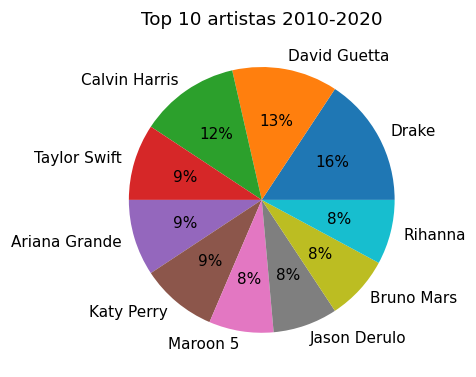

In [13]:
plt.pie(df_top10.loc[:,"Total canciones"], labels = df_top10.loc[:, "artist"], autopct='%.0f%%')
plt.title('Top 10 artistas 2010-2020')
plt.show()

## **Pregunta de Negocio 2**

¿Cómo se diferencian las canciones de los géneros de Latin y Folk/Acoustic en relación con su duración? Halle la diferencia del tiempo promedio de ambos géneros.

Dado que *Folk/Acoustic* se encuentra en registros junto con otros géneros, y que *latin* tiene pueden pertenecer a canciones que estan catalogdos con varios generos, se extraen los registros que pueden tener éstos géneros.


In [14]:
#filtrar las filas que sean de género latin o Folk/Acoustic
df_rel_duracion = dataSpotify[dataSpotify['genre'].str.contains("latin") | dataSpotify['genre'].str.contains("Folk/Acoustic")][{"genre", "duration_ms"}]
#dejando en genre solo el nombre de los generos a analizar
df_rel_duracion.loc[df_rel_duracion['genre'].str.contains('latin'), 'genre'] = 'Latin'
df_rel_duracion.loc[df_rel_duracion['genre'].str.contains('Folk/Acoustic'), 'genre'] = 'Folk/Acoustic'
#Hallando la duración promedio de cada género
print ("Duración promedio latin: %.3f" %df_rel_duracion[df_rel_duracion['genre']=='Latin']["duration_ms"].mean(), "ms")
print ("Duración promedio Folk/Acoustic: %.3f" %df_rel_duracion[df_rel_duracion['genre']=='Folk/Acoustic']["duration_ms"].mean(), "ms")
print ("Diferencia tiempo promedio %.3f" %(df_rel_duracion[df_rel_duracion['genre']=='Latin']["duration_ms"].mean() \
                                         - df_rel_duracion[df_rel_duracion['genre']=='Folk/Acoustic']["duration_ms"].mean()),"ms" )




Duración promedio latin: 226583.705 ms
Duración promedio Folk/Acoustic: 220183.650 ms
Diferencia tiempo promedio 6400.055 ms


De acuerdo a lo anterior, la música Latin en promedio presenta un tiempo de duración promedio superior que Folk/Acoustic, esto es 6400.055ms.

Para visualizar el resultado, se usará un gráfico boxplot que pemite ver donde se situa cada una de las medias, asi como sus respectivos primer y 3 cuartiles.

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


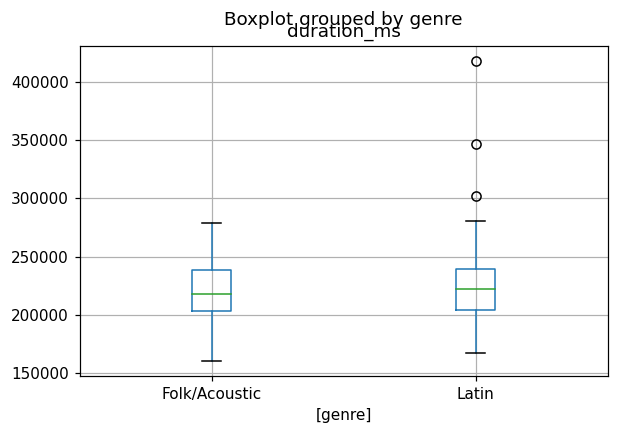

In [15]:
df_rel_duracion.boxplot(by="genre")



Se puede observar que la música Latin presenta valores atípicos de valores superiores. El valor máximo más alto entre los dos géneros es del *latin*. E incluso el valor mínimo es más alto en este género.

In [16]:
print("Mediana de duration_ms para el género Folk/Acoustic: ", df_rel_duracion[(df_rel_duracion["genre"] == 'Folk/Acoustic')].loc[: , "duration_ms"].median())
print("Mediana de duration_ms para el género Latin: ", df_rel_duracion[(df_rel_duracion["genre"] == 'Latin')].loc[: , "duration_ms"].median())

Mediana de duration_ms para el género Folk/Acoustic:  217846.5
Mediana de duration_ms para el género Latin:  222440.0


Respecto a la mediana, para el caso del género latin también resulta ser superior.

## **Pregunta de Negocio 3**

Halle el top 5 de los géneros del 2019 según la cantidad de canciones. ¿Cómo ha variado la cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?

Para los registros que contienen varios géneros en un solo registro, se genera la función splitGenre_newDF, para replicar los registros dejando un solo genero, estos es si un canción es "pop, rock" entonces ahora estara dos veces, una como pop y la segunda como rock.

In [17]:
#Generar el dataframe con los géneros separados:
def splitGenre_newDF (df):
  newDF = pd.DataFrame(columns = df.columns)
  newIndex = 0
  for j in range(len(df['genre'])):
    apoyo = df['genre'][j].split(",")
    for k in apoyo:
      newDF = newDF.append(df.iloc[j, 0:18], ignore_index=True)
      newDF.iloc[newIndex, 17] = k.strip()
      newIndex+=1
  return newDF

In [18]:
newDF = splitGenre_newDF(dataSpotify)
#Ver nuevo DF:
newDF

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160.0,False,2000,77.0,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066.0,False,1999,79.0,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,rock
2,blink-182,All The Small Things,167066.0,False,1999,79.0,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,pop
3,Faith Hill,Breathe,250546.0,False,1999,66.0,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,pop
4,Faith Hill,Breathe,250546.0,False,1999,66.0,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,country
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3526,Post Malone,Goodbyes (Feat. Young Thug),174960.0,True,2019,1.0,0.580,0.653,5,-3.818,1,0.0745,0.4470,0.000000,0.1110,0.175,150.231,hip hop
3527,Jonas Brothers,Sucker,181026.0,False,2019,79.0,0.842,0.734,1,-5.065,0,0.0588,0.0427,0.000000,0.1060,0.952,137.958,pop
3528,Taylor Swift,Cruel Summer,178426.0,False,2019,78.0,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,pop
3529,Sam Smith,Dancing With A Stranger (with Normani),171029.0,False,2019,75.0,0.741,0.520,8,-7.513,1,0.0656,0.4500,0.000002,0.2220,0.347,102.998,pop


Para la primera pregunta, se hace filtro por año igual a 2019, se agrupa por género, se ordena por mayor cuenta y se filtran los primeros 5 registros que contienen el top 5.

In [19]:
#Filtrar por año 2019
newDF[ (newDF["year"] == 2019) ]
#Agrupar por género
newDF[ (newDF["year"] == 2019) ][{"genre", "year"}].groupby("genre").count()
#top5
top5_2019 = newDF[ (newDF["year"] == 2019) ][{"genre", "year"}].groupby("genre").count().sort_values("year", ascending=False).rename(columns={"year":"Total songs 2019"}).iloc[0:5].reset_index()

top5_2019

,genre,Total songs 2019
0,pop,62
1,hip hop,36
2,Dance/Electronic,20
3,R&B,9
4,latin,8


Text(0.5, 1.0, 'Top 5 de los géneros del 2019 según la cantidad de canciones')

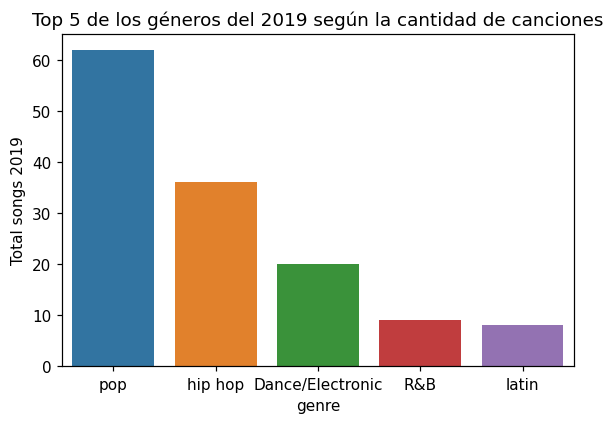

In [20]:
sns.barplot(data=top5_2019, x="genre", y="Total songs 2019")
plt.title('Top 5 de los géneros del 2019 según la cantidad de canciones')

Dentro del top 5 de génros, se observa que el que más cacniones tiene es el pop que casi es el doble del siguiente género que es el hip hop.

EL R&B y el latin tienen una cantidad de canciones muy cercanas.

Ahora el procedimiento para tener la información y saber cómo ha variado la cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019.

In [21]:
#Tener la información solo para los años solicitados: 2000, 2005, 2010, 2015, 2019.
df_2000_2019 = newDF[ (newDF["year"] == 2000) | (newDF["year"] == 2005) | (newDF["year"] == 2010) | (newDF["year"] == 2015) | (newDF["year"] == 2019) ][{"year", "genre", "song"}]

#Agrupar y contar por año y género:
topGenerosDF = df_2000_2019.groupby(['year','genre'])['song'].agg('count').reset_index()
topGenerosDF = topGenerosDF.sort_values(["year", "song"], ascending=False).reset_index()
topGenerosDF

,index,year,genre,song
0,42,2019,pop,62
1,39,2019,hip hop,36
2,37,2019,Dance/Electronic,20
3,38,2019,R&B,9
4,40,2019,latin,8
5,41,2019,metal,2
6,43,2019,rock,2
7,35,2015,pop,80
8,33,2015,hip hop,29
9,30,2015,Dance/Electronic,26


Se grafica agrupado por año, y total por los géneros musicales:

Text(0.5, 1.0, '¿Cómo ha variado la cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?')

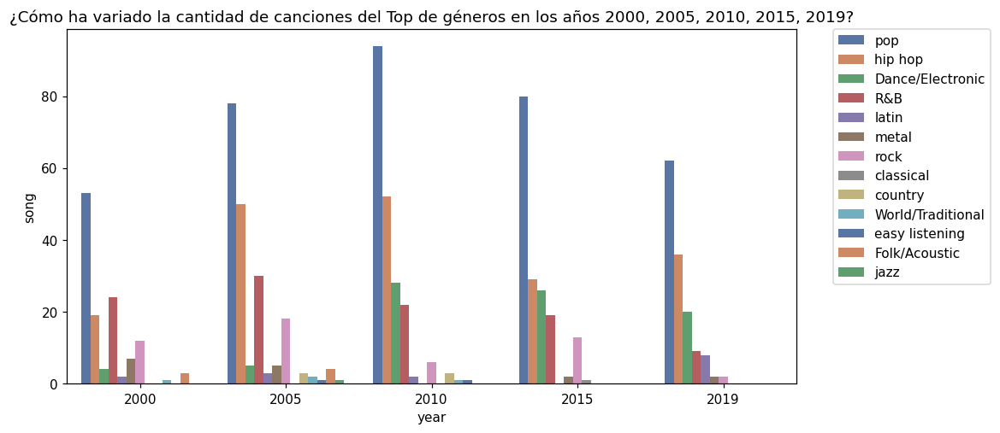

In [22]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(data=topGenerosDF, x="year", y="song", hue="genre", palette="deep")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('¿Cómo ha variado la cantidad de canciones del Top de géneros en los años 2000, 2005, 2010, 2015, 2019?')

La cantidad de canciones para el caso del pop fue en aumento del 2000 al 2010, luego de esto ha ido disminuyendo.

Para la mayoría de los géneros, la cantidad de canciones estan concentradas entre 2000-2010, para el 2015 y 2019 pocos generos lograron aumentar su cantida de canciones, como el caso del latin.

## **Pregunta de Negocio 4**

¿Cómo ha sido la progresión de nuevos artistas? Asuma que un artista nuevo es aquel del cual no se tiene registros pasados y solo es nuevo durante el primer año de aparición.

Se separa la información de artistas por año, filtrado que el artista solo este en el registro del año en el que esta por primera vez en los datos:

---



In [23]:
df_artist = pd.DataFrame(columns ={"year","artist"})
auxYear = []
aux = []
for i in range(1998, 2021):
  auxYear = dataSpotify[(dataSpotify["year"] == i)]['artist']
  for j in auxYear:
    if j not in df_artist['artist']:
      df_artist = df_artist.append({'year': i, 'artist':j}, ignore_index=True)

df_artist

,artist,year
0,Missy Elliott,1998
1,blink-182,1999
2,Faith Hill,1999
3,Sisqo,1999
4,Destiny's Child,1999
...,...,...
1895,Sam Smith,2019
1896,Post Malone,2019
1897,t.A.T.u.,2020
1898,Will Smith,2020


Ya conn los datos organizados, se procede a hacer gráfica para ver el total de artistas por año.

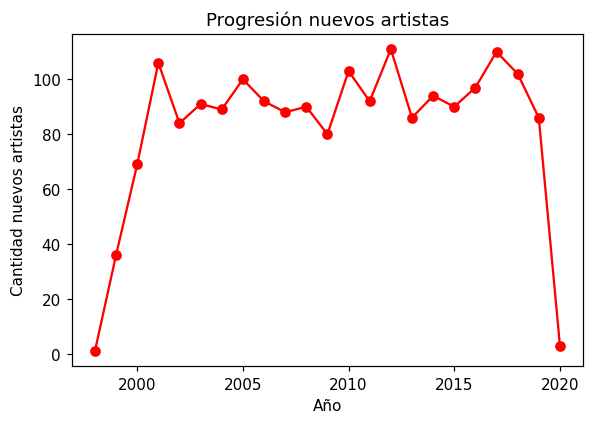

In [24]:
data_plot = df_artist.groupby("year").count().reset_index()
#fig, ax = plt.subplots(figsize=(10, 5))
#sns.lineplot(data = data_plot, x = 'year', y = 'artist', markers=True);

x=data_plot['year']
y=data_plot['artist']
plt.plot(x, y, 'r', marker='o') #Los argumentos 'r' y marker = 'o' se discutirán más adelante.
plt.xlabel('Año')
plt.ylabel('Cantidad nuevos artistas')
plt.title('Progresión nuevos artistas')
plt.show()


Se observa que el aumento fue progresivamente alto entre 1998 y 2000. Después desde el 2001, el aumento de artista estuvo variando entre 80 y 111 artistas nuevos por año, a partir del 2019 la cantidad de artistas nuevos comenzó a descender, en donde para el 2020 solo se tienen 3 artistas nuevo en el listado.

## **Pregunta de Negocio 5**

Grafique la progresión de la popularidad promedio por género y por año. Concluya sobre la gráfica, ej: ¿existen tendencias?

In [25]:
#Nuevamente usamos los datos separando aquellos registros que tienen más de un género, con la función usada en la PN3 y seleccionando solo las columans de interés:
DF_pn5 = splitGenre_newDF(dataSpotify)[{'popularity', 'genre', 'year'}]
DF_pn5

,popularity,genre,year
0,77.0,pop,2000
1,79.0,rock,1999
2,79.0,pop,1999
3,66.0,pop,1999
4,66.0,country,1999
...,...,...,...
3526,1.0,hip hop,2019
3527,79.0,pop,2019
3528,78.0,pop,2019
3529,75.0,pop,2019


Se genera una tabla pivote para ver la información de la pouplaridad promedio de cada género para cada año.

In [26]:
pv_pn5 = DF_pn5.pivot_table(values='popularity',
                                index='year',
                                columns='genre',
                                aggfunc='mean')
pv_pn5

genre,Dance/Electronic,Folk/Acoustic,R&B,World/Traditional,blues,classical,country,easy listening,hip hop,jazz,latin,metal,pop,rock
year,,,,,,,,,,,,,,
1998,NaN,NaN,49.000000,NaN,NaN,NaN,NaN,NaN,49.000000,NaN,NaN,NaN,49.000000,NaN
1999,57.000000,65.000000,65.000000,NaN,66.0,NaN,66.000000,65.0,69.857143,NaN,58.666667,68.000000,63.321429,69.250000
2000,53.000000,45.666667,55.208333,69.0,NaN,NaN,NaN,NaN,59.684211,NaN,30.500000,70.571429,57.943396,59.333333
2001,56.833333,60.000000,58.571429,NaN,NaN,NaN,62.000000,NaN,60.406250,NaN,64.666667,66.125000,58.177778,58.250000
2002,54.666667,66.000000,55.433333,NaN,NaN,NaN,NaN,60.0,59.883721,NaN,NaN,71.200000,60.521739,69.153846
2003,52.600000,NaN,59.437500,61.0,3.0,NaN,NaN,55.0,61.718750,55.0,55.000000,71.250000,58.356164,57.538462
2004,56.444444,NaN,61.566667,60.0,NaN,NaN,NaN,NaN,61.785714,NaN,40.500000,60.000000,56.873016,61.363636
2005,52.000000,60.750000,53.733333,67.5,NaN,NaN,68.333333,60.0,61.860000,60.0,52.666667,69.400000,59.923077,65.388889
2006,54.666667,NaN,62.607143,48.0,NaN,NaN,34.500000,NaN,60.111111,NaN,80.666667,65.000000,55.465753,67.857143


*   A partir de la tabla se puede observar que no se tiene información para todos los años y todos los géneros. Por ejemplo, los géneros *World/Traditional, blues,classical,	country y jazz* son los que más ausencias tienen en popularidad para la mayoría de los años. Por lo cual se podría concluir que son los géneros menos populares.

*   Después del 2017, disminuyen los géneros con datos de popularidad, esto es, hay otros géneros en los que se está concentrando la popularidad. Por ejemplo para el año 2020, la popularidad se concentra en solo 3 géneros: *World/Traditional, hip hop y pop* esto también puede deberse a que se tienen pocos registros para este año.


In [27]:
pv_pn5.describe()

genre,Dance/Electronic,Folk/Acoustic,R&B,World/Traditional,blues,classical,country,easy listening,hip hop,jazz,latin,metal,pop,rock
count,21.000000,12.000000,22.000000,7.000000,3.000000,1.0,9.000000,7.000000,23.000000,2.000000,18.000000,16.000000,23.000000,21.000000
mean,55.293310,64.534722,58.256947,51.785714,41.833333,63.0,55.185185,61.428571,60.607926,57.500000,58.022046,64.354985,57.817972,60.723724
std,6.023400,14.389840,5.580404,23.870933,33.964442,NaN,11.674832,5.533448,5.675540,3.535534,12.659628,10.921935,6.321992,11.457817
min,44.738095,35.500000,47.666667,0.000000,3.000000,63.0,34.500000,55.000000,45.500000,55.000000,30.500000,32.500000,36.500000,32.500000
25%,52.375000,58.625000,55.264583,52.500000,29.750000,63.0,50.000000,59.000000,59.223684,56.250000,51.750000,64.375000,55.726627,58.250000
50%,54.666667,65.500000,58.087970,60.000000,56.500000,63.0,56.500000,60.000000,61.026316,57.500000,56.958333,67.166667,58.356164,62.222222
75%,57.000000,79.000000,61.511364,64.250000,61.250000,63.0,63.333333,62.500000,62.988636,58.750000,64.444444,70.728571,60.736676,67.461538
max,73.607143,81.000000,74.200000,69.000000,66.000000,63.0,68.333333,72.000000,72.500000,60.000000,80.666667,74.800000,70.876712,77.428571


A continuación se muestran otras gráficas que intentan mostrar la prograseión de popularidad de cadad género en cada año.

In [28]:
#Agrupar y contar por año y género:
popularityDF = DF_pn5.groupby(['year','genre'])['popularity'].agg('mean').reset_index()
popularityDF


,year,genre,popularity
0,1998,R&B,49.000000
1,1998,hip hop,49.000000
2,1998,pop,49.000000
3,1999,Dance/Electronic,57.000000
4,1999,Folk/Acoustic,65.000000
...,...,...,...
180,2019,pop,60.951613
181,2019,rock,32.500000
182,2020,World/Traditional,57.000000
183,2020,hip hop,45.500000


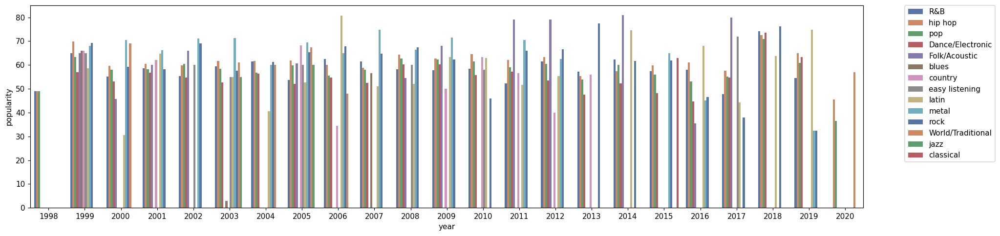

In [29]:
fig, ax = plt.subplots(figsize=(20, 5))
sns.barplot(data=popularityDF, x="year", y="popularity", hue="genre", palette="deep")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

Dado que ver toda la información es compleja, se genera un nuevo gráfico en donde solo se tendrá en cuenta los géneros *'Dance/Electronic', 'R&B', 'hip hop', 'latin', 'metal', 'pop' y 'rock'* que son los que más datos tienen de popularidad para la mayoría de los años:

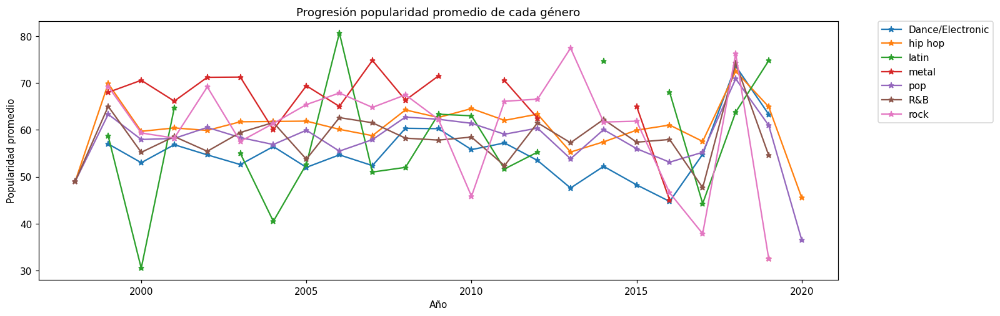

In [30]:
df_aux = pv_pn5[{'Dance/Electronic', 'R&B', 'hip hop', 'latin', 'metal', 'pop', 'rock'}].reset_index()
x = df_aux["year"]

fig, ax = plt.subplots(figsize=(15, 5))
plt.plot(x, df_aux["Dance/Electronic"], label = "Dance/Electronic", marker='*') 
plt.plot(x, df_aux["hip hop"], label = "hip hop", marker='*') 
plt.plot(x, df_aux["latin"], label = "latin", marker='*')
plt.plot(x, df_aux["metal"], label = "metal", marker='*') 
plt.plot(x, df_aux["pop"], label = "pop", marker='*') 
plt.plot(x, df_aux["R&B"], label = "R&B", marker='*') 
plt.plot(x, df_aux["rock"], label = "rock", marker='*')
plt.xlabel('Año')
plt.ylabel('Popularidad promedio')
plt.title('Progresión popularidad promedio de cada género')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

*   Los valores más altos de popularidad se presentaron en el 2018, luego de ésto han bajado para todos a excepción de la música latina que tuvo aumento en el 2019.

*   La popularidad de la música *Dance/Electronic* estuvo en aumento hasta el año 2008, pero luego descendió y hasta el 2017 volvió a aumentar.

*   La música hip-hop presenta valores de popularidad por enciama del 45.50






## **Pregunta de Negocio 6**

Compare los géneros Pop y Rock según sus características de: energy, valence y tempo. Concluya sobre su análisis.

Para este caso, también trabajaremos con dataframe separando aquellos regitros que tienen registros con más de un género, con la función usada en la PN3 y seleccionando solo las columnas de interés.

In [31]:
df_PN6 = splitGenre_newDF(dataSpotify)[{'genre', 'energy', 'valence', 'tempo'}]
df_PN6 = df_PN6 [ (df_PN6["genre"] == 'pop') | (df_PN6["genre"] == 'rock')]
df_PN6 

,energy,genre,tempo,valence
0,0.834,pop,95.053,0.894
1,0.897,rock,148.726,0.684
2,0.897,pop,148.726,0.684
3,0.496,pop,136.859,0.278
5,0.913,rock,119.992,0.544
...,...,...,...,...
3522,0.887,pop,170.918,0.881
3524,0.790,pop,125.002,0.847
3527,0.734,pop,137.958,0.952
3528,0.702,pop,169.994,0.564


In [32]:
print("Cifras de estadística descriptiva para el género pop")
print(df_PN6[(df_PN6["genre"] == 'pop')].describe())
print("Cifras de estadística descriptiva para el género rock")
print(df_PN6[(df_PN6["genre"] == 'rock')].describe())

Cifras de estadística descriptiva para el género pop
            energy        tempo      valence
count  1567.000000  1567.000000  1567.000000
mean      0.715492   119.734572     0.553841
std       0.151229    26.477831     0.221830
min       0.054900    60.019000     0.038100
25%       0.618000    99.008500     0.390000
50%       0.732000   120.014000     0.558000
75%       0.832000   133.357500     0.738000
max       0.999000   210.851000     0.973000
Cifras de estadística descriptiva para el género rock
           energy       tempo     valence
count  224.000000  224.000000  224.000000
mean     0.791027  126.155839    0.527743
std      0.140706   28.000921    0.218133
min      0.316000   68.976000    0.068100
25%      0.710000  104.631500    0.368000
50%      0.829500  124.395000    0.532000
75%      0.903250  144.737500    0.713500
max      0.988000  199.935000    0.965000


Antes de hacer las comparaciones, hay que clarificar que los datos no están balanceados o similares en cantidad para ambos géneros, para el género pop se cuenta con 1567 registros mientras que para rock solo se tienen 224.

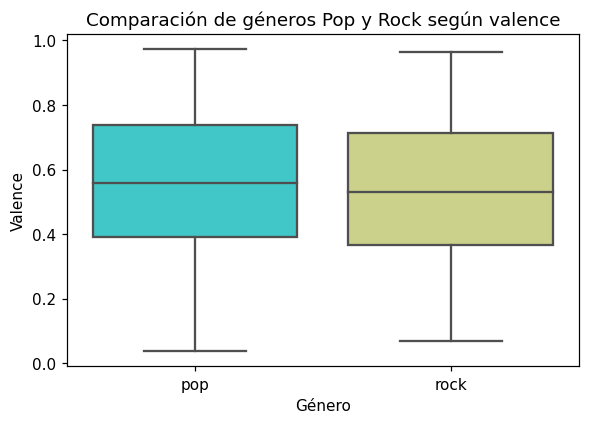

In [33]:
ax = sns.boxplot(x="genre", 
                 y="valence", 
                 data=df_PN6, 
                 palette='rainbow')

ax.set_title("Comparación de géneros Pop y Rock según valence")
ax.set_xlabel("Género")
ax.set_ylabel("Valence");

In [34]:
print("Mediana de valence para el género pop: %s", df_PN6[(df_PN6["genre"] == 'pop')].loc[: , "valence"].median())
print("Mediana de valence para el género rock: %s", df_PN6[(df_PN6["genre"] == 'rock')].loc[: , "valence"].median())

Mediana de valence para el género pop: %s 0.558
Mediana de valence para el género rock: %s 0.532


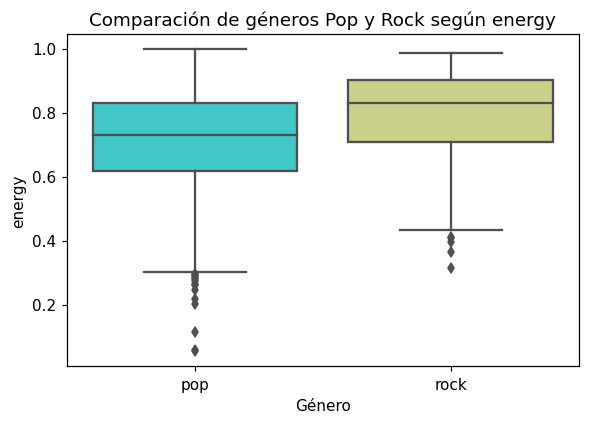

In [35]:
ax = sns.boxplot(x="genre", 
                 y="energy", 
                 data=df_PN6, 
                 palette='rainbow')

ax.set_title("Comparación de géneros Pop y Rock según energy")
ax.set_xlabel("Género")
ax.set_ylabel("energy");



In [36]:
print("Mediana de valence para el género pop: %s", df_PN6[(df_PN6["genre"] == 'pop')].loc[: , "energy"].median())
print("Mediana de valence para el género rock: %s", df_PN6[(df_PN6["genre"] == 'rock')].loc[: , "energy"].median())

Mediana de valence para el género pop: %s 0.732
Mediana de valence para el género rock: %s 0.8294999999999999


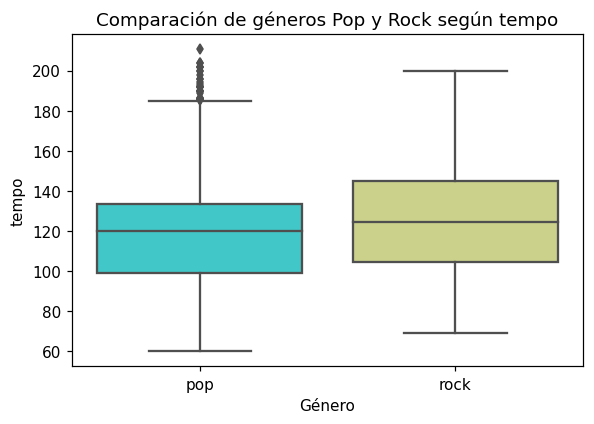

In [37]:
ax = sns.boxplot(x="genre", 
                 y="tempo", 
                 data=df_PN6, 
                 palette='rainbow')

ax.set_title("Comparación de géneros Pop y Rock según tempo")
ax.set_xlabel("Género")
ax.set_ylabel("tempo");

In [38]:
print("Mediana de valence para el género pop: %s", df_PN6[(df_PN6["genre"] == 'pop')].loc[: , "tempo"].median())
print("Mediana de valence para el género rock: %s", df_PN6[(df_PN6["genre"] == 'rock')].loc[: , "tempo"].median())

Mediana de valence para el género pop: %s 120.014
Mediana de valence para el género rock: %s 124.39500000000001


Comparando los géneros *pop y rock* según valence o “positividad musical”. Por una parte, los promedios son muy cercanos (0.55 y 0.52) siendo un poco superior la positividad del género pop, así mismo su máximo también es superior por lo que se realiza la hipótesis que el género pop puede ser más positivo que el rock aunque es por un valor muy pequeño, aunque en el mínimo valor es más pequeño para el pop, revisando la medida vemos que  sigue siendo mayor que el de rock.

Comparando los géneros *pop y rock* según energy o la medida porcentual de la intensidad y actividad, en promedio para el rock es mayor que para el pop, así como sus máximos presenta los valores más altos, y el mínimo es mayor que el pop. Claramente se puede inferir que el rock contiene más energía, de acuerdo a la media se sigue observando que el rock es mayor (esto es, lo valores extremos influyen menos en los valores) lo que da mayor certeza de la interpretación de los datos. Se observa que para ambos casos los valores atípicos se presentan por debajo del percentil 25.

Comparando los géneros *pop y rock* según el tempo aunque en las medias se ven valores cercanos, el rango intercuartil es más amplio para el género rock. El género pop presenta valores atípicos por encima del percentil 75. En general el tempo es mayor en el caso del rock: promedio, máximo, media.


## **Pregunta de Negocio 7**

Plantee una pregunta de negocio de su interés, ya sea por tipo de música, artistas u otra dimensión, mediante la cual se analicen al menos 3 variables del dataset y concluya.

**Cómo es la correlación entre lass variables *energy, loudness, valence* para canciones de género rock, pop o latin. Y ésta que tanto cambia respecto a todos los registros del dataset.**

In [39]:
df_PN7 = splitGenre_newDF(dataSpotify)[{'genre', 'energy', 'loudness', 'valence'}]
df_PN7 = df_PN7 [ (df_PN7["genre"] == 'pop') | (df_PN7["genre"] == 'rock') | (df_PN7["genre"] == 'latin')]
df_PN7

,energy,genre,loudness,valence
0,0.834,pop,-5.444,0.894
1,0.897,rock,-4.918,0.684
2,0.897,pop,-4.918,0.684
3,0.496,pop,-9.007,0.278
5,0.913,rock,-4.063,0.544
...,...,...,...,...
3522,0.887,pop,-3.967,0.881
3524,0.790,pop,-4.617,0.847
3527,0.734,pop,-5.065,0.952
3528,0.702,pop,-5.707,0.564


In [40]:
cor_PN7 = df_PN7.corr()
round(cor_PN7,2)

,energy,loudness,valence
energy,1.00,0.66,0.34
loudness,0.66,1.00,0.25
valence,0.34,0.25,1.00


Text(0.5, 1.0, "Correlación para 'loudness', 'valence', 'tempo' de los géneros  rock, pop y latin")

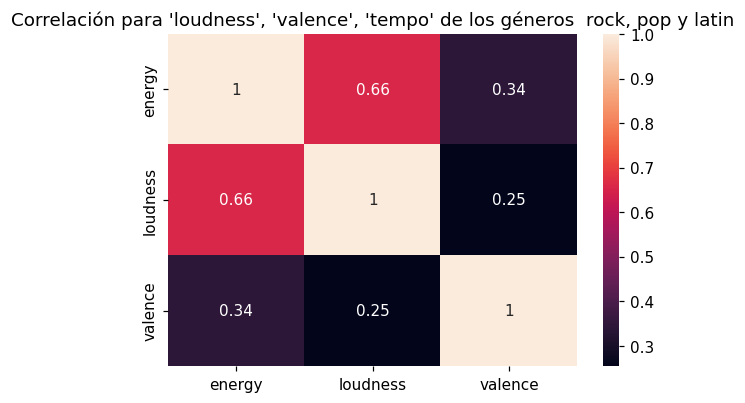

In [41]:
ax = sns.heatmap(cor_PN7, annot=True)
ax.set_title("Correlación para 'loudness', 'valence', 'tempo' de los géneros  rock, pop y latin")

Se puede ver que la correlación es positiva entre las tres variables es positiva (directa). La correlación más fuerte se presenta entre el loudness y la energía de la canción. El valence o “positividad musical” tiene una correlación más baja con el loudness y la energía.


Text(0.5, 1.0, "Correlación para 'loudness', 'valence', 'tempo' para todos los registros")

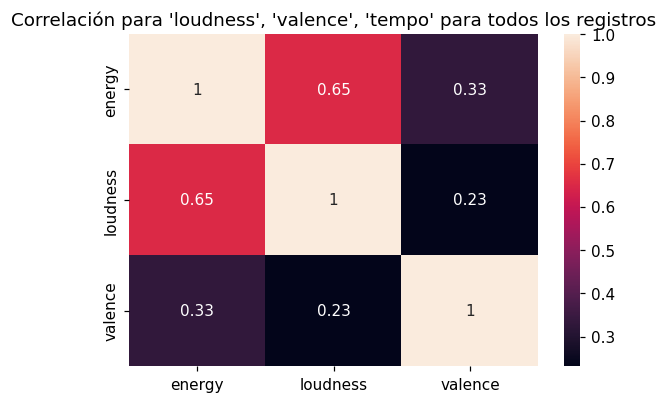

In [42]:
cor_PN7_total = dataSpotify[{'genre', 'energy', 'loudness', 'valence'}].corr()
round(cor_PN7_total,2)
ax = sns.heatmap(cor_PN7_total, annot=True)
ax.set_title("Correlación para 'loudness', 'valence', 'tempo' para todos los registros")

Al revisar las tres variables y sus correlaciones para todas las canciones se observa que se mantiene muy similar para los casos de los 3 géneros, con consideración que la fuerza de la correlación disminuye ligeramente en comparación con la primera matriz.